In [4]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import tifffile
from pathlib import Path
from skimage.morphology import label, remove_small_objects
from skimage.measure import regionprops_table
from skimage.color import label2rgb

In [18]:
import shapely
from shapely import Polygon, Point, STRtree
import rasterio
from rasterio import features

In [5]:
sample_id = 'HT206B1_H1_06252022'
output_dir = f'../../multiplex_data/analysis/brca_dcis_v1/region_metrics/{sample_id}'
Path(output_dir).mkdir(parents=True, exist_ok=True)

In [ ]:

a = sc.read_h5ad(f'../../multiplex_data/analysis/brca_dcis_v1/metaclustered/{sample_id}.h5ad')
a

In [ ]:
a.obs

In [ ]:
fig, ax = plt.subplots(
    figsize=(int(max(a.obs['centroid_col']) / 1000), int(max(a.obs['centroid_row']) / 1000)))
sc.pl.scatter(a, x='centroid_col', y='centroid_row_inverted', color='cell_type_general', ax=ax, size=10)

In [ ]:
fig, ax = plt.subplots(
    figsize=(int(max(a.obs['centroid_col']) / 1000), int(max(a.obs['centroid_row']) / 1000)))
sc.pl.scatter(a, x='centroid_col', y='centroid_row_inverted', color='harmonized_cell_type', ax=ax, size=10)

In [ ]:
fig, ax = plt.subplots(
    figsize=(int(max(a.obs['centroid_col']) / 1000), int(max(a.obs['centroid_row']) / 1000)))
sc.pl.scatter(a, x='centroid_col', y='centroid_row_inverted', color='metacluster', ax=ax, size=10)

In [ ]:
tumor_regions = tifffile.imread(
    f'../../multiplex_data/codex/htan/brca/{sample_id}/level_3/annotations/tumor_mask_10_alpha.tif')
plt.imshow(tumor_regions)

In [ ]:
tumor_regions.max()

In [ ]:
labeled = label(tumor_regions)
np.unique(labeled)

In [ ]:
regions = regionprops_table(labeled, properties=(
    'label', 'bbox', 'area', 'perimeter', 'centroid', 'eccentricity', 'extent'))
region_df = pd.DataFrame(regions)
region_df = region_df.set_index('label')

In [ ]:
region_df

In [ ]:
sns.distplot(region_df[region_df['area']<10000]['area'])


In [ ]:
tumor_regions = remove_small_objects(tumor_regions, min_size=4000)
labeled = label(tumor_regions)
regions = regionprops_table(labeled, properties=(
    'label', 'bbox', 'area', 'perimeter', 'centroid', 'eccentricity', 'extent'))
region_df = pd.DataFrame(regions)
region_df = region_df.set_index('label')

In [ ]:
plt.imshow(tumor_regions)

In [ ]:
region_df

In [ ]:
a.obs['tumor_region_id'] = [labeled[int(r), int(c)] for r, c in zip(a.obs['centroid_row'], a.obs['centroid_col'])]

In [ ]:
fig, ax = plt.subplots(
    figsize=(int(max(a.obs['centroid_col']) / 1000), int(max(a.obs['centroid_row']) / 1000)))
sc.pl.scatter(a, x='centroid_col', y='centroid_row_inverted', color='tumor_region_id', ax=ax, size=10)

In [ ]:
from skimage.segmentation import expand_labels

In [ ]:
# roughly 2 pixels per micron, numbers from angelo paper
epithelial = expand_labels(labeled, distance=40)

In [ ]:
plt.imshow(epithelial)

In [ ]:
mask = labeled>0
plt.imshow(mask)

In [ ]:
plt.imshow(mask[10000:12000, 5000:7000])

In [ ]:
from skimage.morphology import erosion
eroded = mask.copy()
for i in range(10):
    eroded = erosion(eroded)


In [ ]:
plt.imshow(eroded[10000:12000, 5000:7000])

In [ ]:
ductal = np.zeros_like(labeled)
ductal[eroded] = labeled[eroded]

In [ ]:
plt.imshow(labeled)

In [ ]:
plt.imshow(ductal)

In [ ]:
plt.imshow(epithelial)

In [ ]:
epithelial_mask = epithelial>0
ductal_mask = ductal>0
myo_mask = epithelial_mask ^ ductal_mask
plt.imshow(myo_mask)

In [ ]:
plt.imshow(myo_mask[10000:12000, 5000:7000])

In [ ]:
myo = np.zeros_like(epithelial)
myo[myo_mask] = epithelial[myo_mask]

In [ ]:
plt.imshow(myo)

In [ ]:
outer = expand_labels(labeled, distance=100) # 50 microns
boundary = np.zeros_like(outer)

outer_mask = outer>0
ductal_mask = ductal>0
boundary_mask = outer_mask ^ ductal_mask

boundary[boundary_mask] = outer[boundary_mask]

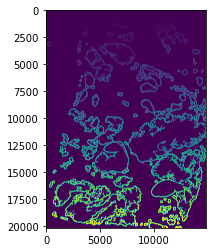

In [1102]:
plt.imshow(boundary)

In [1103]:
for name, img in labeled_dict.items():
    print(name, img.dtype)

ductal int32
myoepithelial bool
epithelial int32
boundary int32
region int32


In [1104]:
labeled_dict = {
    'ductal': ductal,
#     'myoepithelial': myo,
    'epithelial': epithelial,
    'boundary': boundary,
    'region': labeled
}

mask_dict = {
    'ductal': ductal>0,
#     'myoepithelial': myo>0,
    'epithelial': epithelial>0,
    'boundary': boundary>0,
    'region': labeled>0
}

In [1105]:
props_dict = {}
for name, img in labeled_dict.items():
    regions = regionprops_table(img, properties=(
        'label', 'bbox', 'area', 'perimeter', 'centroid', 'eccentricity', 'extent'))
    df = pd.DataFrame(regions)
    df = df.set_index('label')
    props_dict[name] = df

In [ ]:
region_to_bbox = {l:(r1, c1, r2, c2)
                  for l, r1, c1, r2, c2 in zip(
                      props_dict['boundary'].index,
                      props_dict['boundary']['bbox-0'],
                      props_dict['boundary']['bbox-1'], 
                      props_dict['boundary']['bbox-2'],
                      props_dict['boundary']['bbox-3'])}

In [ ]:
from mip.utils import extract_ome_tiff

In [ ]:
channel_to_img = extract_ome_tiff(f'../../multiplex_data/codex/htan/brca/{sample_id}/level_2/HT206B1_H1_06252022.ome.tiff')
channel_to_img.keys()

In [ ]:
pseudo = tifffile.imread(f'../../multiplex_data/codex/htan/brca/{sample_id}/level_2/pseudo/dapi_panck_sma_pdpn_mgp.tiff')
plt.imshow(pseudo)

In [737]:
len(region_to_bbox)

442

1


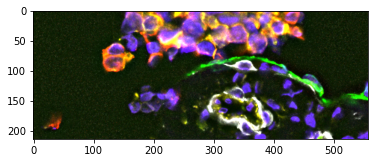

2


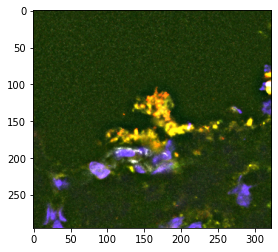

3


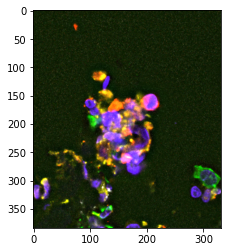

4


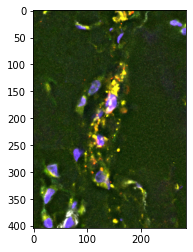

5


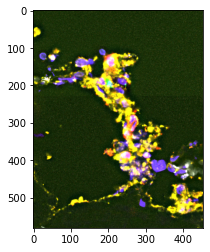

6


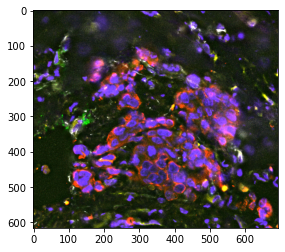

7


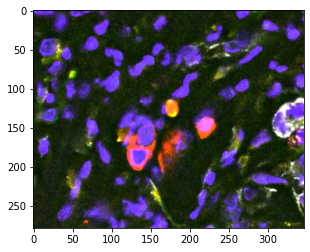

8


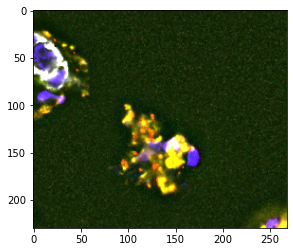

9


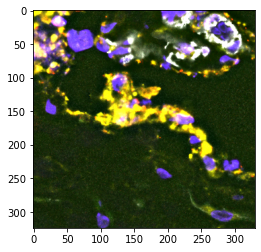

10


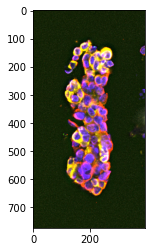

11


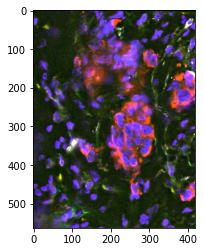

12


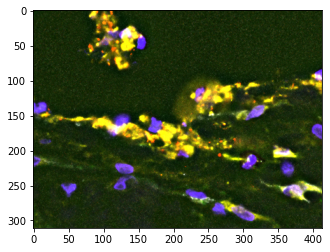

13


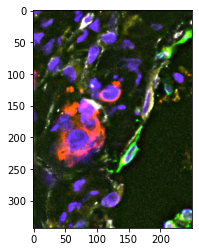

14


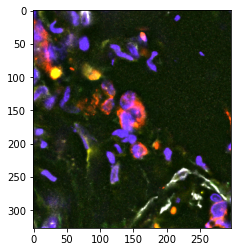

15


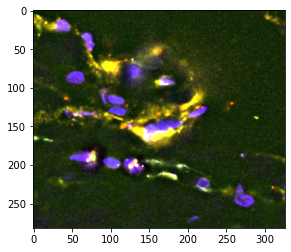

16


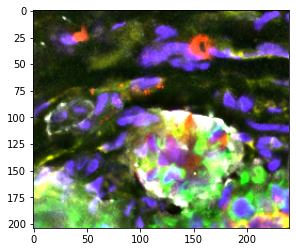

17


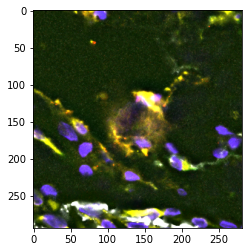

18


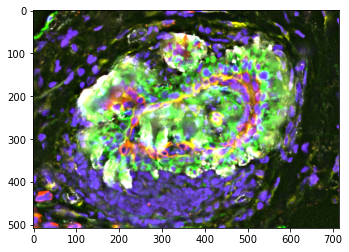

19


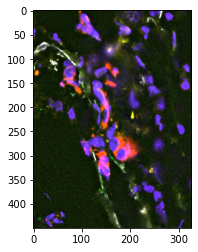

20


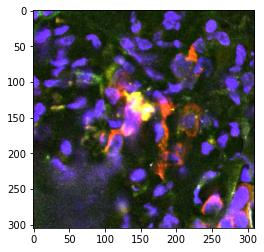

21


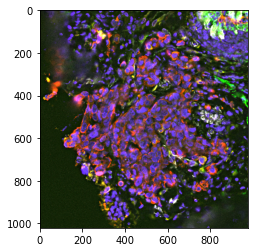

22


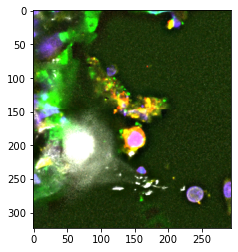

23


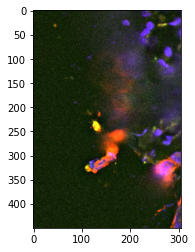

24


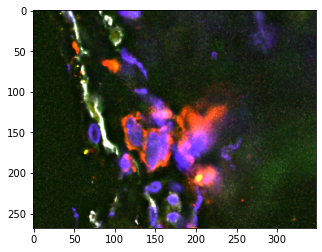

25


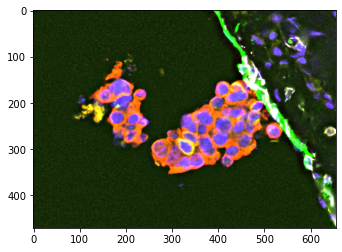

26


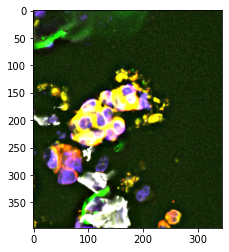

27


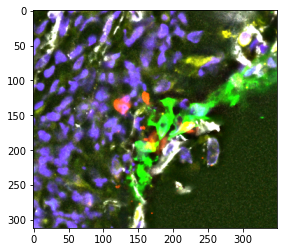

28


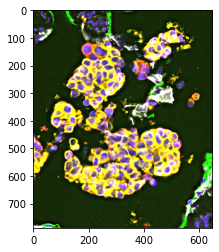

29


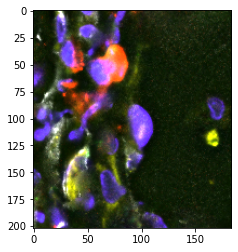

30


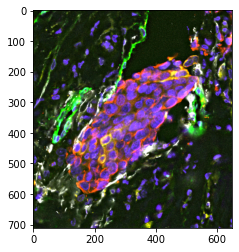

31


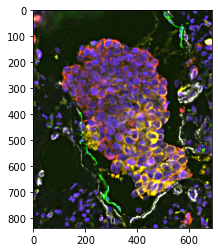

32


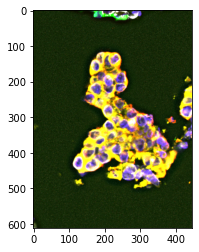

33


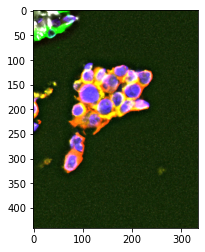

34


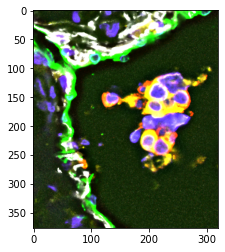

35


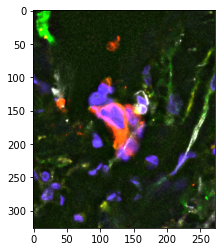

36


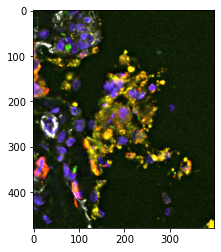

37


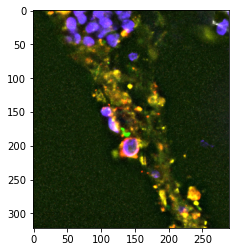

38


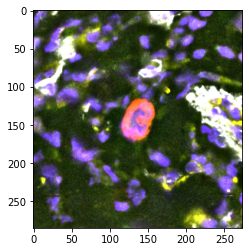

39


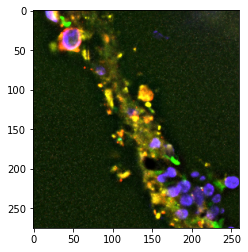

40


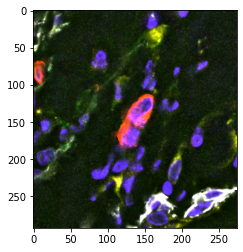

41


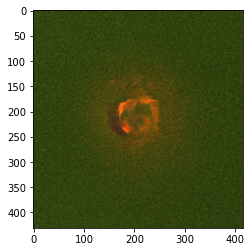

42


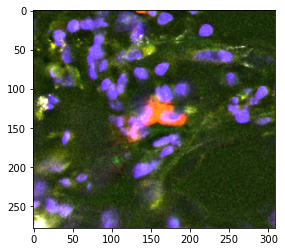

43


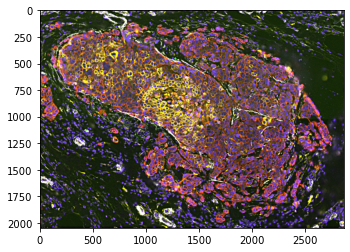

44


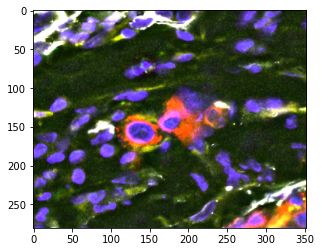

45


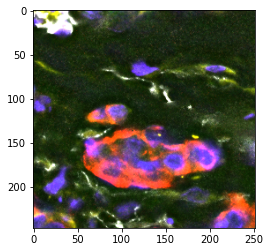

46


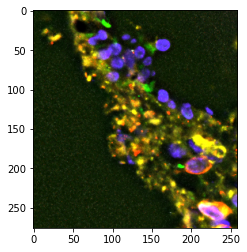

47


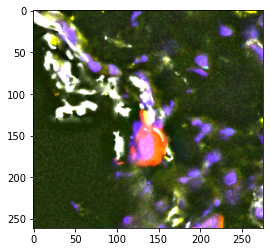

48


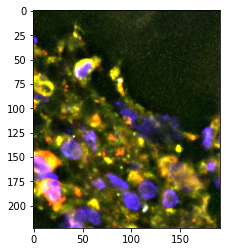

49


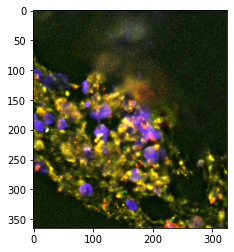

50


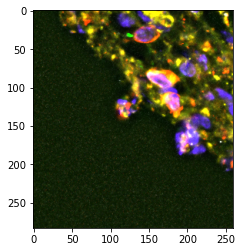

51


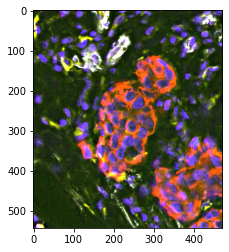

52


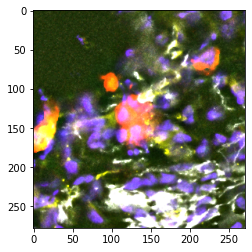

53


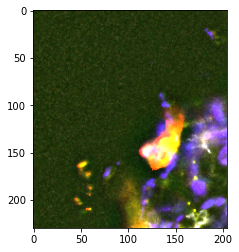

54


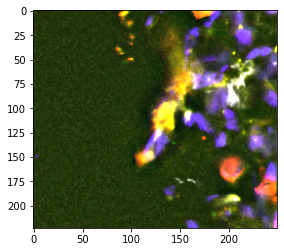

55


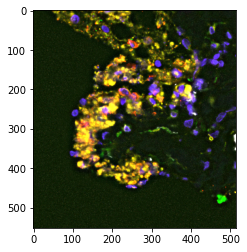

56


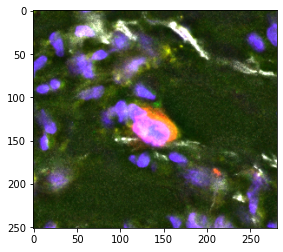

57


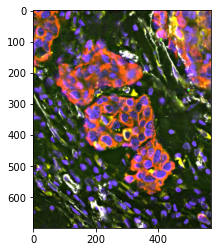

58


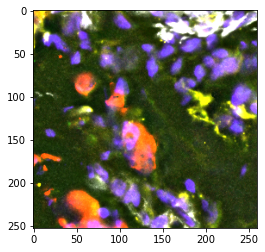

59


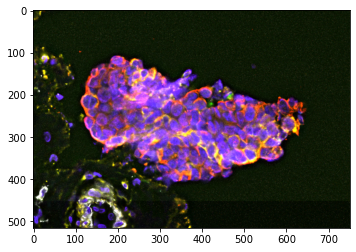

60


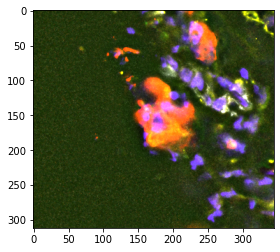

61


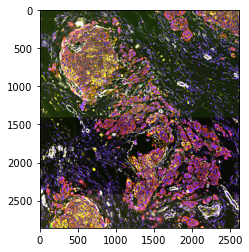

62


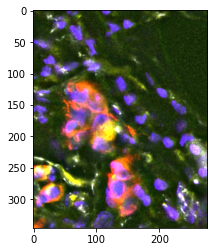

63


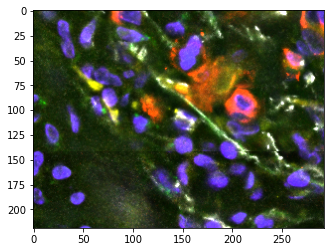

64


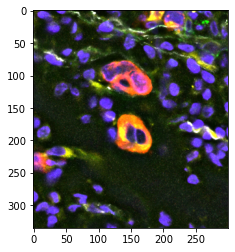

65


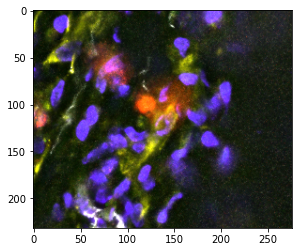

66


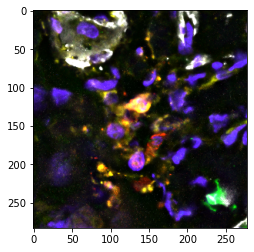

67


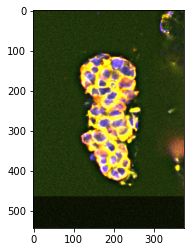

68


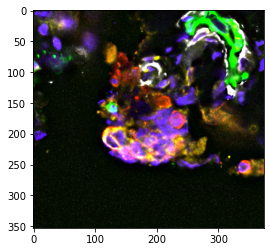

69


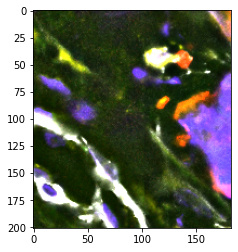

70


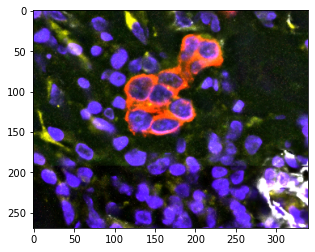

71


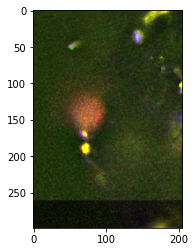

72


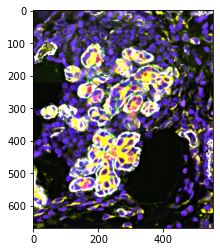

73


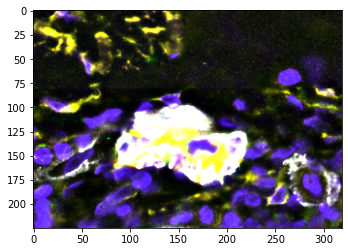

74


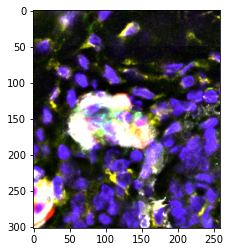

75


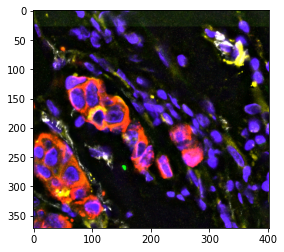

76


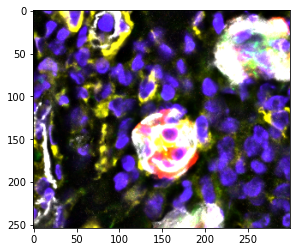

77


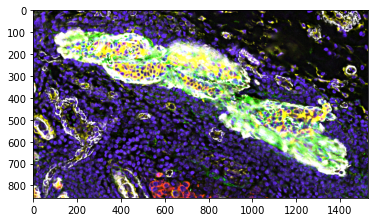

78


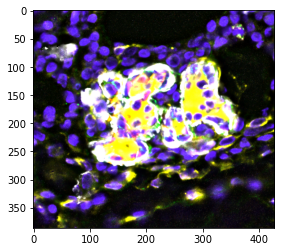

79


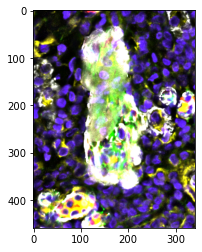

80


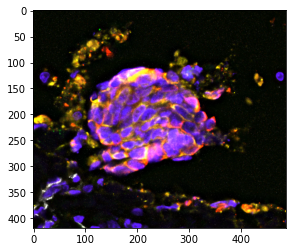

81


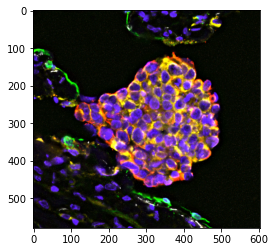

82


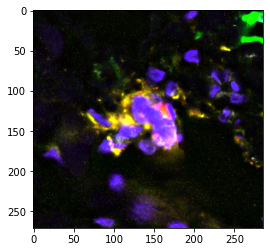

83


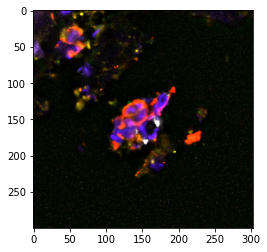

84


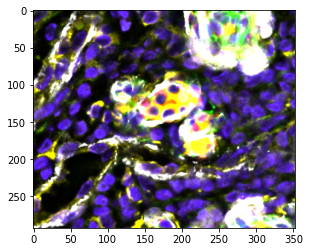

85


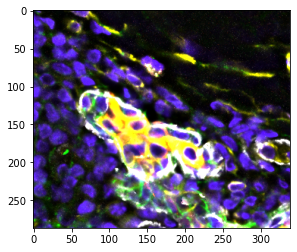

86


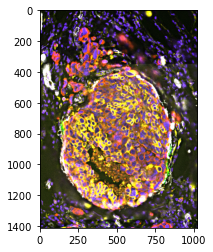

87


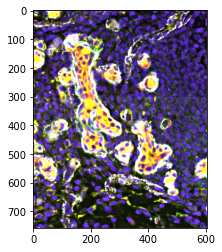

88


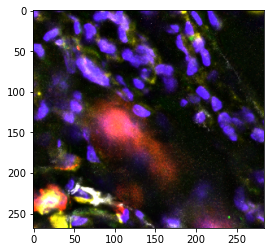

89


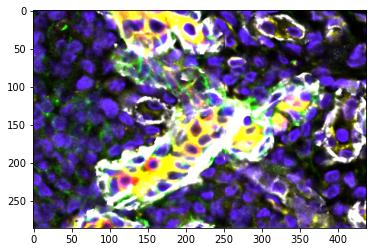

90


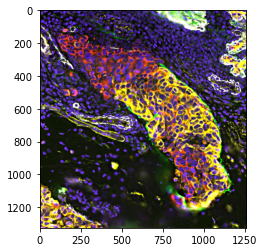

91


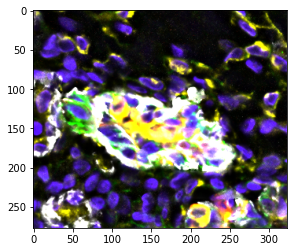

92


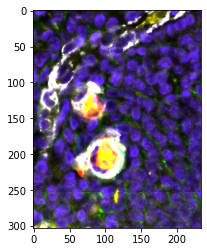

93


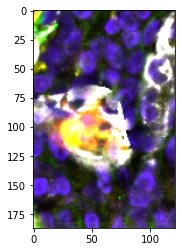

94


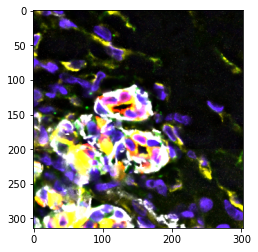

95


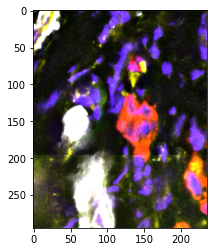

96


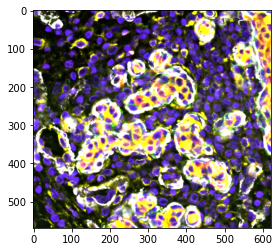

97


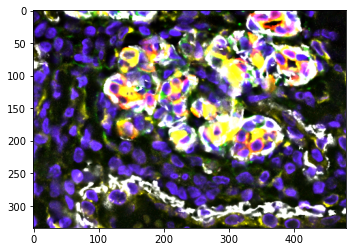

98


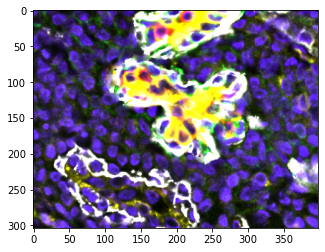

99


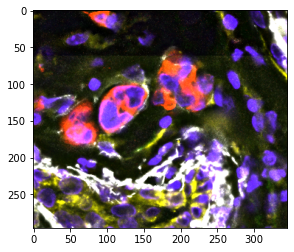

In [736]:
for l in range(1, 50, 1):
    print(l)
    r1, c1, r2, c2 = region_to_bbox[l]
    plt.imshow(pseudo[r1:r2, c1:c2])
    plt.show()

In [1108]:
for name, img in labeled_dict.items():
    a.obs[f'{name}_region_id'] = [img[int(r), int(c)] for r, c in zip(a.obs['centroid_row'], a.obs['centroid_col'])]

#### metrics

###### polsby popper

In [1109]:
import math
def compute_polsby_popper(area, perimeter):
    try:
        return 4 * math.pi * area / perimeter ** 2
    except ZeroDivisionError:
        return math.nan

In [1110]:
for name, df in props_dict.items():
    df['compactness'] = [compute_polsby_popper(area, per)
                         for area, per in zip(df['area'], df['perimeter'])]

###### cell fractions

In [1111]:
from collections import Counter
cell_types = sorted(set(a.obs['harmonized_cell_type']))
for name, df in props_dict.items():
    data = []
    for region in df.index:
        ls = a[a.obs[f'{name}_region_id']==region].obs['harmonized_cell_type']
        counts = Counter(ls)
        data.append([counts[ct] / (len(ls) + 1) for ct in cell_types])
    frac_df = pd.DataFrame(data=data, columns=[f'{ct}_cell_fraction' for ct in cell_types],
                           index=df.index.to_list())
    props_dict[name] = pd.concat((df, frac_df), axis=1)
    

In [1112]:
next(iter(props_dict.values()))

,bbox-0,bbox-1,bbox-2,bbox-3,area,perimeter,centroid-0,centroid-1,eccentricity,extent,compactness,CD4 T cell_cell_fraction,CD8 T cell_cell_fraction,Endothelial_cell_fraction,Fibroblast_cell_fraction,Macrophage - M1_cell_fraction,Macrophage - M2_cell_fraction,Myoepithelial_cell_fraction,Noise_cell_fraction,Tumor_cell_fraction
1,0,11012,103,11349,19482,909.949314,37.456678,11182.203367,0.968860,0.561263,0.295671,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.952381
2,114,4573,189,4674,3651,294.663997,155.824432,4626.284853,0.560117,0.481980,0.528406,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.000000
3,185,10694,349,10806,9244,535.043723,274.554197,10744.952942,0.759303,0.503267,0.405781,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.900000
4,196,5675,380,5739,1887,421.960461,273.063063,5703.188129,0.993694,0.160241,0.133180,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.666667
5,889,5997,1250,6216,29339,1253.100685,1063.439211,6113.362862,0.944522,0.371103,0.234792,0.0,0.0,0.0,0.0,0.0,0.0,0.0625,0.0,0.906250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,19763,8301,19904,8436,5763,479.788889,19840.532362,8377.462780,0.961015,0.302758,0.314600,0.2,0.0,0.0,0.0,0.0,0.0,0.2000,0.0,0.400000
439,19790,9146,19863,9219,2745,241.137085,19826.616758,9182.118033,0.840828,0.515106,0.593231,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.750000
440,20021,10826,20160,11127,28747,891.168614,20100.706752,10991.130448,0.903030,0.687086,0.454865,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.964286
441,20047,12287,20112,12443,2534,342.871104,20070.656275,12374.238753,0.964845,0.249901,0.270866,0.0,0.0,0.0,0.0,0.0,0.0,0.2000,0.0,0.600000


In [1113]:
cell_types = sorted(set(a.obs['metacluster']))
for name, df in props_dict.items():
    data = []
    for region in df.index:
        ls = a[a.obs[f'{name}_region_id']==region].obs['metacluster']
        counts = Counter(ls)
        data.append([counts[ct] / (len(ls) + 1) for ct in cell_types])
    frac_df = pd.DataFrame(data=data, columns=[f'{ct}_metacluster_fraction' for ct in cell_types],
                           index=df.index.to_list())
    props_dict[name] = pd.concat((df, frac_df), axis=1)
    

In [1114]:
next(iter(props_dict.values()))

,bbox-0,bbox-1,bbox-2,bbox-3,area,perimeter,centroid-0,centroid-1,eccentricity,extent,...,Mixed Immune/Stroma_metacluster_fraction,Myoepithelial_metacluster_fraction,Stroma_metacluster_fraction,T cell Enriched_metacluster_fraction,Tumor_metacluster_fraction,Tumor Boundary - M2 Macrophage Enriched_metacluster_fraction,Tumor Boundary - Mixed_metacluster_fraction,Tumor Boundary - Mixed Immune Enriched_metacluster_fraction,Tumor Boundary - Stroma Enriched 1_metacluster_fraction,Tumor Boundary - Stroma Enriched 2_metacluster_fraction
1,0,11012,103,11349,19482,909.949314,37.456678,11182.203367,0.968860,0.561263,...,0.0,0.0,0.0,0.0,0.904762,0.0,0.0,0.0,0.0,0.047619
2,114,4573,189,4674,3651,294.663997,155.824432,4626.284853,0.560117,0.481980,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000
3,185,10694,349,10806,9244,535.043723,274.554197,10744.952942,0.759303,0.503267,...,0.0,0.0,0.0,0.0,0.700000,0.0,0.0,0.0,0.0,0.200000
4,196,5675,380,5739,1887,421.960461,273.063063,5703.188129,0.993694,0.160241,...,0.0,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.000000
5,889,5997,1250,6216,29339,1253.100685,1063.439211,6113.362862,0.944522,0.371103,...,0.0,0.0,0.0,0.0,0.968750,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,19763,8301,19904,8436,5763,479.788889,19840.532362,8377.462780,0.961015,0.302758,...,0.0,0.0,0.0,0.0,0.200000,0.0,0.0,0.0,0.0,0.600000
439,19790,9146,19863,9219,2745,241.137085,19826.616758,9182.118033,0.840828,0.515106,...,0.0,0.0,0.0,0.0,0.750000,0.0,0.0,0.0,0.0,0.000000
440,20021,10826,20160,11127,28747,891.168614,20100.706752,10991.130448,0.903030,0.687086,...,0.0,0.0,0.0,0.0,0.964286,0.0,0.0,0.0,0.0,0.000000
441,20047,12287,20112,12443,2534,342.871104,20070.656275,12374.238753,0.964845,0.249901,...,0.0,0.0,0.0,0.0,0.800000,0.0,0.0,0.0,0.0,0.000000


###### arc grid fractions

In [741]:
def mask_to_polygon(mask):
    for shape, value in features.shapes(mask.astype(np.int16), connectivity=4, mask=(mask >0), transform=rasterio.Affine(1.0, 0, 0, 0, 1.0, 0)):
        return shapely.geometry.shape(shape)

In [772]:
def generate_labeled_expansion_grid(
    mask, inner_offset=20, parallel_step=50, perp_steps=5, expansion=80, grouping_dist=10):
    ring = mask_to_polygon(mask).exterior
    ring = ring.parallel_offset(inner_offset, side='left')
    perp_step = (expansion + inner_offset) // perp_steps
    rings = []
    for i in range(perp_steps):
#         print(f'generating ring {i}')
        new = ring.parallel_offset(perp_step * i, side='right')
        rings.append(new)
    rings[0] = ring # fails on offset of zero so replacing
    
    # generate grid
    polys = []
    for i in range(len(rings) - 1):
#         print(f'generating polygons for ring {i}')
        inner_ring = rings[i]
        outer_ring = rings[i + 1]
        parallel_steps = int(inner_ring.length // parallel_step)
        first_inner_pt, last_inner_pt, first_outer_pt, last_outer_pt = None, None, None, None
        for j in range(parallel_steps + 1):
            inner_pt1 = inner_ring.interpolate(j * parallel_step)
            if j != parallel_steps:
                inner_pt2 = inner_ring.interpolate((j + 1) * parallel_step)
            else:
                inner_pt2 = inner_ring.interpolate(inner_ring.length * .9999)

            inner_pts = [inner_ring.interpolate(x)
                         for x in range(j * parallel_step, (j + 1) * parallel_step, 1)]

            if shapely.shortest_line(inner_pt1, outer_ring) is not None:
                outer_pt1 = Point(shapely.shortest_line(inner_pt1, outer_ring).coords[1])
                outer_pt2 = Point(shapely.shortest_line(inner_pt2, outer_ring).coords[1])
                d1, d2 = outer_ring.project(outer_pt1), outer_ring.project(outer_pt2)

                outer_pts = [outer_ring.interpolate(x)
                             for x in range(int(d2), int(d1) - 1, -1)]

                poly_pts = inner_pts
                poly_pts += outer_pts
                poly_pts = [pt.coords[0] for pt in poly_pts]
                poly = Polygon(poly_pts)
                polys.append(poly)
                
            if not j:
                first_inner_pt = inner_pt1
                first_outer_pt = outer_pt1
            if j == parallel_steps:
                last_inner_pt = inner_pt2
                last_outer_pt = outer_pt2
        
        # close outer rings
        poly_pts = [last_inner_pt, last_outer_pt, first_outer_pt, first_inner_pt]
        poly_pts = [pt.coords[0] for pt in poly_pts]
        poly = Polygon(poly_pts)
        polys.append(poly)
                
    # generate tile groupings
    tree = STRtree(polys)
    inner_ring = rings[0]
    outer_ring = rings[-1]
    parallel_steps = int(inner_ring.length // grouping_dist)
    groups = []
    group_lines = []
    for j in range(parallel_steps):
        dist = (j * grouping_dist) + (grouping_dist // 2)
        inner_pt = inner_ring.interpolate(dist)
        line = shapely.shortest_line(inner_pt, outer_ring)
        idxs = tree.query(line, predicate="intersects")
        groups.append(idxs + 1) # adding 1 to match label mask
        group_lines.append(line)
    
    labeled_grid = np.zeros(mask.shape, dtype=np.int32)
    for i, poly in enumerate(polys):
        mask = rasterio.features.rasterize([poly], out_shape=mask.shape)
        labeled_grid[mask!=0] = i + 1
    return labeled_grid, polys, groups, group_lines


def generate_grid_props(region_id, labeled_dict,
                       parallel_step=50, perp_steps=5, expansion=50, grouping_dist=10):
    r1, c1, r2, c2 = region_to_bbox[region_id]
    mask = (labeled_dict['region'][r1:r2, c1:c2]==region_id).astype(np.int16)
    labeled_grid, polys, groups, group_lines = generate_labeled_expansion_grid(
        mask, parallel_step=parallel_step, perp_steps=perp_steps,
        expansion=expansion, grouping_dist=grouping_dist
    )
    
    return labeled_grid, polys, groups, group_lines
    
    


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


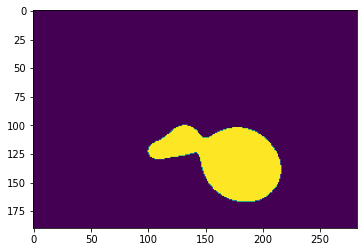

In [821]:
grid_dict = {}
for region_id in region_to_bbox.keys():
    print(region_id)
    labeled_grid, polys, groups, group_lines = generate_grid_props(
        region_id, labeled_dict,
        inner_offset=20, parallel_step=50, perp_steps=5, expansion=80, grouping_dist=10
    )
    grid_dict[region_id] = {
        'labeled_grid': labeled_grid,
        'polys': polys,
        'groups': groups,
        'group_lines': group_lines
    }


sanity check random region

In [1062]:
l = 157
r1, c1, r2, c2 = region_to_bbox[l]

In [1063]:
d = grid_dict[l]
d.keys()

dict_keys(['labeled_grid', 'polys', 'groups', 'group_lines', 'filtered_polys', 'filtered_labeled_grid', 'filtered_group_lines', 'filtered_groups'])

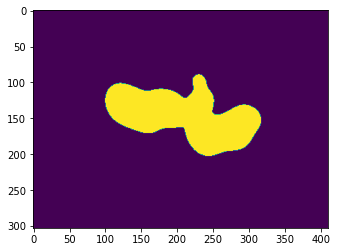

In [1064]:
plt.imshow((labeled_dict['region']==l)[r1:r2, c1:c2])

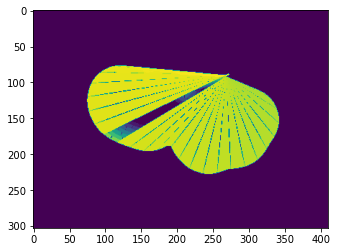

In [1065]:
plt.imshow(d['labeled_grid'])

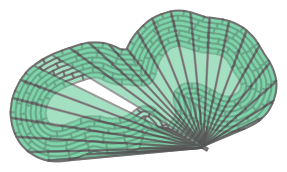

In [1066]:
shapely.GeometryCollection(d['polys'])

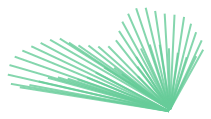

In [1067]:
shapely.GeometryCollection(d['group_lines'])

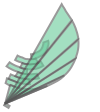

In [1068]:
pool = d['groups'][10]
shapely.GeometryCollection(
    [g for i, g in enumerate(d['polys']) if i+1 in pool]
)

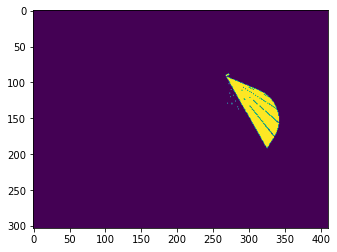

In [1069]:
new = np.zeros_like(d['labeled_grid'], dtype=bool)
for idx in pool:
    new[d['labeled_grid']==idx] = True
plt.imshow(new)

In [1070]:
# ls = [p.area for p in d['polys'] if p.area < 1000]
# sns.distplot(ls)
# d.keys()

In [1071]:
# ls = [p.length for p in d['group_lines']]
# sns.distplot(ls)

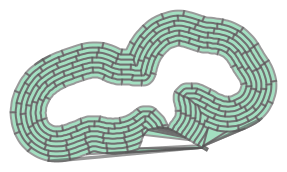

In [1072]:
shapely.GeometryCollection([p for p in d['polys'] if p.area < 200])

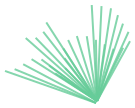

In [1073]:
shapely.GeometryCollection([p for p in d['group_lines'] if p.length < 100])

In [905]:
area_thresh = 200
group_line_thresh = 100
for region_id, d in grid_dict.items():
    print(region_id)
    remove_idxs = [i for i, p in enumerate(d['polys']) if p.area > area_thresh]
    keep_idxs = [i for i, p in enumerate(d['polys']) if p.area <= area_thresh]
    filtered_polys = [d['polys'][i] for i in keep_idxs]
    
    filtered_labeled_grid = d['labeled_grid'].copy()
    for i in remove_idxs:
        filtered_labeled_grid[d['labeled_grid']==i] = 0
    
    idxs = [i for i, p in enumerate(d['group_lines']) if p.length <= group_line_thresh]
    filtered_group_lines = [d['group_lines'][i] for i in idxs]
    filtered_groups = [d['groups'][i] for i in idxs]
    
    d.update({
        'filtered_polys': filtered_polys,
        'filtered_labeled_grid': filtered_labeled_grid,
        'filtered_group_lines': filtered_group_lines,
        'filtered_groups': filtered_groups
    })

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [906]:
from skimage.morphology import binary_dilation
from skimage.measure import label

def get_positive_grid(labeled_grid, df):
    new = np.zeros_like(labeled_grid)
    for l in df[df['is_positive']].index:
        new[labeled_grid==l] = l
    return new

def get_num_pieces(pos_grid):
    new = pos_grid!=0
    new = binary_dilation(new)
    
    labeled = label(new)
    return np.unique(labeled).shape[0] - 1

def get_thicknesses(labeled_grid, df, groups):
    pool = set(np.unique(labeled_grid))
    valid = []
    for group in groups:
        # check to make sure it's not out of bounds
        keep = True
        for idx in group:
            if idx not in pool:
                keep = False
                break
        valid.append(keep)
    
    groups = [g for g, keep in zip(groups, valid) if keep]
    
    thicknesses = []
    for group in groups:
        thicknesses.append(df.loc[group]['is_positive'].sum())
    
    return np.asarray(thicknesses)

In [1076]:
def generate_myo_props(region_id, labeled_dict, myo_grid_dict, region_to_bbox, channel_to_img,
                       channel_to_thresh={'SMA': 1500, 'Podoplanin': 5000}):
    r1, c1, r2, c2 = region_to_bbox[region_id]
    d = myo_grid_dict[region_id]
    labeled_grid = d['labeled_grid']
    groups = d['groups']
    
    channel_to_props = {}
    channel_to_df = {}
    channel_to_pos_grid = {}
    for channel, thresh in channel_to_thresh.items():
        img = channel_to_img[channel][r1:r2, c1:c2]
        df = pd.DataFrame(regionprops_table(labeled_grid, intensity_image=img,
            properties=('label', 'area', 'intensity_mean')))
        df = df.set_index('label')
        df['is_positive'] = df['intensity_mean']>=thresh
        channel_to_df[channel] = df
        
        thicknesses = get_thicknesses(labeled_grid, df, groups)
        pos_grid = get_positive_grid(labeled_grid, df)
        channel_to_pos_grid[channel] = pos_grid
        channel_to_props[channel] = {
            'num_grids': df.shape[0],
            'total_area': df['area'].sum(),
            'mean_intensity': df['intensity_mean'].mean(),
            'num_pieces': get_num_pieces(pos_grid),
            'fraction_positive': df['is_positive'].sum() / df.shape[0],
            'integrity': 1 - (np.count_nonzero(thicknesses==0) / len(thicknesses)) if len(thicknesses) else np.nan,
            'mean_thickness': thicknesses.mean(),
            'mean_thickness_nonbreaks': thicknesses[thicknesses!=0].mean() if np.count_nonzero(thicknesses!=0) else 0.
        }
        
    combined_props = {}
    pos_grids = np.asarray(list(channel_to_pos_grid.values())) # (num_channels, H, W)
    combined_props['num_pieces'] = get_num_pieces(pos_grids.max(axis=0))
    
    ls = np.asarray([df['is_positive'].to_list() for df in channel_to_df.values()]) # (num_channels, num_grids)
    is_positive = ls.sum(axis=0)
    df = next(iter(channel_to_df.values())).copy()
    df['is_positive'] = is_positive
    thicknesses = get_thicknesses(labeled_grid, df, groups)
    combined_props.update({
        'overlap_fraction': np.count_nonzero(ls.sum(axis=0)==ls.shape[0]) / ls.shape[1],
        'fraction_positive': df['is_positive'].sum() / df.shape[0],
        'integrity': 1 - (np.count_nonzero(thicknesses==0) / len(thicknesses)) if len(thicknesses) else np.nan,
        'mean_thickness': thicknesses.mean(),
        'mean_thickness_nonbreaks': thicknesses[thicknesses!=0].mean() if np.count_nonzero(thicknesses!=0) else 0.
    })
    
    channel_to_pos_grid['combined'] = pos_grids.max(axis=0)
    channel_to_props['combined'] = combined_props
    
    return channel_to_df, channel_to_props, channel_to_pos_grid

In [911]:
unfiltered_grid_dict = {k:{k2:v2 for k2, v2 in v.items() if 'filtered' not in k2}
                        for k, v in grid_dict.items()}
filtered_grid_dict = {k:{k2.replace('filtered_', ''):v2 for k2, v2 in v.items() if 'filtered_' in k2}
                        for k, v in grid_dict.items()}

In [1078]:
region_to_myo_props = {}
for region_id in grid_dict.keys():
    print(region_id)
    channel_to_df, channel_to_props, channel_to_pos_grid = generate_myo_props(
        region_id, labeled_dict, filtered_grid_dict, region_to_bbox, channel_to_img,
        channel_to_thresh={'SMA': 1500, 'Podoplanin': 5000}
    )
    region_to_myo_props[region_id] = {
        'channel_to_df': channel_to_df,
        'channel_to_props': channel_to_props,
        'channel_to_pos_grid': channel_to_pos_grid
    }

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158


/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: Mean of empty slice.
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/ipykernel_launcher.py:46: RuntimeWarning: Mean of empty slice.


159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374
375
376
377
378
379
380
381
382
383
384
385
386
387
388
389
390
391
392
393
394
395
396
397
398
399
400
401
402
403
404
405
406
407
408


In [1091]:
l = 86
# l = 98
# l = 90
# l = 180
d = region_to_myo_props[l]

# channel_to_df, channel_to_props, channel_to_pos_grid = generate_myo_props(
#     l, labeled_dict, filtered_grid_dict, region_to_bbox, channel_to_img,
#     channel_to_thresh={'SMA': 1500, 'Podoplanin': 5000}
# )

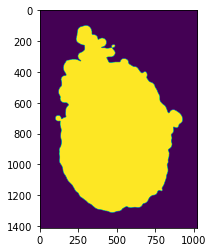

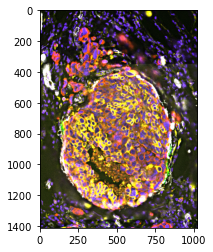

In [1092]:
# l = 157
r1, c1, r2, c2 = region_to_bbox[l]
plt.imshow((labeled_dict['region']==l)[r1:r2, c1:c2])
plt.show()
plt.imshow(pseudo[r1:r2, c1:c2])
plt.show()

In [1093]:
r1, r2, c1, c2

(5699, 7111, 3556, 4580)

In [1094]:
channel = 'SMA'
# channel = 'Podoplanin'
df = d['channel_to_df'][channel]
df

,area,intensity_mean,is_positive
label,,,
1,104,153.000000,False
2,107,171.140187,False
3,100,123.740000,False
4,83,107.156627,False
5,103,77.271845,False
...,...,...,...
1696,102,182.519608,False
1697,98,180.448980,False
1698,97,445.010309,False


In [1095]:
d['channel_to_props'][channel]

{'num_grids': 1699,
 'total_area': 164210,
 'mean_intensity': 1036.1898280601788,
 'num_pieces': 35,
 'fraction_positive': 0.13066509711595056,
 'integrity': 0.4731182795698925,
 'mean_thickness': 1.1397849462365592,
 'mean_thickness_nonbreaks': 2.409090909090909}

In [1096]:
d['channel_to_props']['combined']

{'num_pieces': 29,
 'overlap_fraction': 0.014125956444967627,
 'fraction_positive': 0.16597998822836962,
 'integrity': 0.478494623655914,
 'mean_thickness': 1.478494623655914,
 'mean_thickness_nonbreaks': 3.0898876404494384}

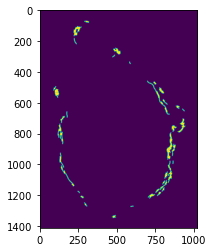

In [1097]:
plt.imshow(d['channel_to_pos_grid'][channel]>0)

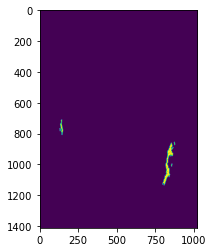

In [1098]:
plt.imshow(d['channel_to_pos_grid']['Podoplanin']>0)

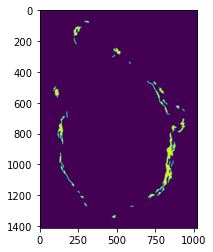

In [1099]:
plt.imshow(d['channel_to_pos_grid']['combined']>0)

#### integration

integrate metrics into something cohesive

In [1115]:
props_dict.keys()

dict_keys(['ductal', 'epithelial', 'boundary', 'region'])

In [1118]:
combined_df = None
for k, df in props_dict.items():
    temp = df.copy()
    temp.columns = [f'{k}_{c}' for c in temp.columns]
    if combined_df is None:
        combined_df = temp
    else:
        combined_df = pd.concat((combined_df, temp), axis=1)
combined_df

,ductal_bbox-0,ductal_bbox-1,ductal_bbox-2,ductal_bbox-3,ductal_area,ductal_perimeter,ductal_centroid-0,ductal_centroid-1,ductal_eccentricity,ductal_extent,...,region_Mixed Immune/Stroma_metacluster_fraction,region_Myoepithelial_metacluster_fraction,region_Stroma_metacluster_fraction,region_T cell Enriched_metacluster_fraction,region_Tumor_metacluster_fraction,region_Tumor Boundary - M2 Macrophage Enriched_metacluster_fraction,region_Tumor Boundary - Mixed_metacluster_fraction,region_Tumor Boundary - Mixed Immune Enriched_metacluster_fraction,region_Tumor Boundary - Stroma Enriched 1_metacluster_fraction,region_Tumor Boundary - Stroma Enriched 2_metacluster_fraction
1,0,11012,103,11349,19482,909.949314,37.456678,11182.203367,0.968860,0.561263,...,0.0,0.000000,0.0,0.0,0.833333,0.041667,0.0,0.0,0.041667,0.041667
2,114,4573,189,4674,3651,294.663997,155.824432,4626.284853,0.560117,0.481980,...,0.0,0.000000,0.5,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,185,10694,349,10806,9244,535.043723,274.554197,10744.952942,0.759303,0.503267,...,0.0,0.000000,0.0,0.0,0.750000,0.000000,0.0,0.0,0.000000,0.166667
4,196,5675,380,5739,1887,421.960461,273.063063,5703.188129,0.993694,0.160241,...,0.0,0.000000,0.0,0.0,0.500000,0.000000,0.0,0.0,0.000000,0.000000
5,889,5997,1250,6216,29339,1253.100685,1063.439211,6113.362862,0.944522,0.371103,...,0.0,0.025641,0.0,0.0,0.948718,0.000000,0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,19763,8301,19904,8436,5763,479.788889,19840.532362,8377.462780,0.961015,0.302758,...,0.0,0.000000,0.0,0.0,0.200000,0.000000,0.0,0.0,0.000000,0.600000
439,19790,9146,19863,9219,2745,241.137085,19826.616758,9182.118033,0.840828,0.515106,...,0.0,0.000000,0.0,0.0,0.750000,0.000000,0.0,0.0,0.000000,0.000000
440,20021,10826,20160,11127,28747,891.168614,20100.706752,10991.130448,0.903030,0.687086,...,0.0,0.000000,0.0,0.0,0.964286,0.000000,0.0,0.0,0.000000,0.000000
441,20047,12287,20112,12443,2534,342.871104,20070.656275,12374.238753,0.964845,0.249901,...,0.0,0.000000,0.0,0.0,0.833333,0.000000,0.0,0.0,0.000000,0.000000


In [1136]:
import re
cols = [f'{channel}_{k}' 
        for channel, meta in next(iter(region_to_myo_props.values()))['channel_to_props'].items()
        for k, v in meta.items()]
idxs = []
data = []
for region_id in combined_df.index:
    d = region_to_myo_props[region_id]
    idxs.append(region_id)
    row = []
    for col in cols:
        channel = re.sub(r'^([^_]+)_.*$', r'\1', col)
        metric = re.sub(r'^[^_]+_(.*)$', r'\1', col)
        val = d['channel_to_props'][channel][metric]
        row.append(val)
    data.append(row)
    
myo_df = pd.DataFrame(data=data, columns=cols, index=idxs)
myo_df.columns = [f'myoepithelial_metrics_{c}' for c in myo_df.columns]
myo_df

,myoepithelial_metrics_SMA_num_grids,myoepithelial_metrics_SMA_total_area,myoepithelial_metrics_SMA_mean_intensity,myoepithelial_metrics_SMA_num_pieces,myoepithelial_metrics_SMA_fraction_positive,myoepithelial_metrics_SMA_integrity,myoepithelial_metrics_SMA_mean_thickness,myoepithelial_metrics_SMA_mean_thickness_nonbreaks,myoepithelial_metrics_Podoplanin_num_grids,myoepithelial_metrics_Podoplanin_total_area,...,myoepithelial_metrics_Podoplanin_fraction_positive,myoepithelial_metrics_Podoplanin_integrity,myoepithelial_metrics_Podoplanin_mean_thickness,myoepithelial_metrics_Podoplanin_mean_thickness_nonbreaks,myoepithelial_metrics_combined_num_pieces,myoepithelial_metrics_combined_overlap_fraction,myoepithelial_metrics_combined_fraction_positive,myoepithelial_metrics_combined_integrity,myoepithelial_metrics_combined_mean_thickness,myoepithelial_metrics_combined_mean_thickness_nonbreaks
1,251,23691,285.406858,1,0.031873,0.175000,0.400000,2.285714,251,23691,...,0.083665,0.550000,1.200000,2.181818,2,0.007968,0.115538,0.550000,1.600000,2.909091
2,188,17947,353.762945,2,0.021277,0.185185,0.296296,1.600000,188,17947,...,0.015957,0.111111,0.185185,1.666667,3,0.000000,0.037234,0.296296,0.481481,1.625000
3,288,27791,190.270982,1,0.003472,0.020000,0.020000,1.000000,288,27791,...,0.027778,0.140000,0.380000,2.714286,2,0.000000,0.031250,0.160000,0.400000,2.500000
4,217,20983,282.862417,0,0.000000,0.000000,0.000000,0.000000,217,20983,...,0.013825,0.242424,0.242424,1.000000,2,0.000000,0.013825,0.242424,0.242424,1.000000
5,568,54810,234.032883,1,0.001761,0.016949,0.016949,1.000000,568,54810,...,0.005282,0.025424,0.025424,1.000000,4,0.000000,0.007042,0.042373,0.042373,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,268,25740,367.895059,2,0.082090,0.066667,0.511111,7.666667,268,25740,...,0.003731,0.022222,0.022222,1.000000,3,0.000000,0.085821,0.088889,0.533333,6.000000
439,166,15948,123.434261,2,0.018072,0.090909,0.181818,2.000000,166,15948,...,0.006024,0.090909,0.090909,1.000000,2,0.006024,0.024096,0.090909,0.272727,3.000000
440,346,32464,63.376346,0,0.000000,0.000000,0.000000,0.000000,346,32464,...,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000
441,202,19336,59.993496,0,0.000000,0.000000,0.000000,0.000000,202,19336,...,0.004950,0.066667,0.066667,1.000000,1,0.000000,0.004950,0.066667,0.066667,1.000000


In [1137]:
combined_df = pd.concat((combined_df, myo_df), axis=1)
combined_df

,ductal_bbox-0,ductal_bbox-1,ductal_bbox-2,ductal_bbox-3,ductal_area,ductal_perimeter,ductal_centroid-0,ductal_centroid-1,ductal_eccentricity,ductal_extent,...,myoepithelial_metrics_Podoplanin_fraction_positive,myoepithelial_metrics_Podoplanin_integrity,myoepithelial_metrics_Podoplanin_mean_thickness,myoepithelial_metrics_Podoplanin_mean_thickness_nonbreaks,myoepithelial_metrics_combined_num_pieces,myoepithelial_metrics_combined_overlap_fraction,myoepithelial_metrics_combined_fraction_positive,myoepithelial_metrics_combined_integrity,myoepithelial_metrics_combined_mean_thickness,myoepithelial_metrics_combined_mean_thickness_nonbreaks
1,0,11012,103,11349,19482,909.949314,37.456678,11182.203367,0.968860,0.561263,...,0.083665,0.550000,1.200000,2.181818,2,0.007968,0.115538,0.550000,1.600000,2.909091
2,114,4573,189,4674,3651,294.663997,155.824432,4626.284853,0.560117,0.481980,...,0.015957,0.111111,0.185185,1.666667,3,0.000000,0.037234,0.296296,0.481481,1.625000
3,185,10694,349,10806,9244,535.043723,274.554197,10744.952942,0.759303,0.503267,...,0.027778,0.140000,0.380000,2.714286,2,0.000000,0.031250,0.160000,0.400000,2.500000
4,196,5675,380,5739,1887,421.960461,273.063063,5703.188129,0.993694,0.160241,...,0.013825,0.242424,0.242424,1.000000,2,0.000000,0.013825,0.242424,0.242424,1.000000
5,889,5997,1250,6216,29339,1253.100685,1063.439211,6113.362862,0.944522,0.371103,...,0.005282,0.025424,0.025424,1.000000,4,0.000000,0.007042,0.042373,0.042373,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,19763,8301,19904,8436,5763,479.788889,19840.532362,8377.462780,0.961015,0.302758,...,0.003731,0.022222,0.022222,1.000000,3,0.000000,0.085821,0.088889,0.533333,6.000000
439,19790,9146,19863,9219,2745,241.137085,19826.616758,9182.118033,0.840828,0.515106,...,0.006024,0.090909,0.090909,1.000000,2,0.006024,0.024096,0.090909,0.272727,3.000000
440,20021,10826,20160,11127,28747,891.168614,20100.706752,10991.130448,0.903030,0.687086,...,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000
441,20047,12287,20112,12443,2534,342.871104,20070.656275,12374.238753,0.964845,0.249901,...,0.004950,0.066667,0.066667,1.000000,1,0.000000,0.004950,0.066667,0.066667,1.000000


In [1176]:
combined_df.to_csv(os.path.join(output_dir, 'region_props.txt'), sep='\t')

In [1180]:
to_save = {k:{
        'labeled': labeled_dict[k],
        'mask': mask_dict[k],
   } for k in labeled_dict.keys()
}
np.save(os.path.join(output_dir, 'regions.npy'), to_save)

In [1181]:
region_ids = combined_df.index.to_list()
to_save = {k:{
        'myo_grid_binary_positive_regions': region_to_myo_props[k]['channel_to_pos_grid'],
        'myo_grid_labeled_regions_filtered': filtered_grid_dict[k]['labeled_grid'],
        'myo_grid_labeled_regions_unfiltered': unfiltered_grid_dict[k]['labeled_grid'],
   }
   for k in region_ids
}
np.save(os.path.join(output_dir, 'myo_grid_regions.npy'), to_save)

In [1183]:
filtered_grid_dict[10]

{'polys': [<POLYGON ((197.332 110, 198.332 110, 199.332 110, 200.272 110.274, 201.217 1...>,
  <POLYGON ((209.498 123.091, 209.855 124.024, 210.049 124.987, 210.198 125.97...>,
  <POLYGON ((221.419 137.65, 222.395 137.859, 223.388 137.97, 224.387 138, 225...>,
  <POLYGON ((241.154 136.48, 242.085 136.117, 243.02 135.79, 243.988 135.539, ...>,
  <POLYGON ((259.648 129.303, 260.583 129, 261.583 129, 262.583 129, 263.509 1...>,
  <POLYGON ((276.632 137.466, 277.219 138.275, 277.861 139.037, 278.31 139.929...>,
  <POLYGON ((283 155.928, 283 156.928, 282.889 157.903, 282.525 158.833, 282.2...>,
  <POLYGON ((276.12 174.414, 275.62 175.27, 274.985 176.041, 274.43 176.871, 2...>,
  <POLYGON ((271.248 193.172, 271.514 194.135, 271.875 195.067, 272.056 196.03...>,
  <POLYGON ((276.019 212.377, 276.106 213.372, 276.293 214.353, 276.577 215.31...>,
  <POLYGON ((274.894 231.893, 274.529 232.823, 274.258 233.785, 273.969 234.73...>,
  <POLYGON ((267.215 250.229, 266.76 251.116, 266.109 251.874, 265.

In [1184]:
from shapely.wkt import dumps
import json
to_save = {k:{
        'myo_polygons_filtered': {k:list(dumps(v)) for k, v in filtered_grid_dict[k].items() if k in ['polys', 'group_lines']},
        'myo_polygons_unfiltered': {k:list(dumps(v)) for k, v in unfiltered_grid_dict[k].items() if k in ['polys', 'group_lines']},
    }
   for k in region_ids
}
json.dump(to_save, open(os.path.join(output_dir, 'myo_polygons.json'), 'w'))


In [1224]:
to_save = {k:{
        'myo_grid_channel_to_df': {c:df.to_dict() for c, df in region_to_myo_props[k]['channel_to_df'].items()},
    }
    for k in region_ids
}

json.dump(to_save,
          open(os.path.join(output_dir, 'other_region_metadata.json'), 'w'))

In [1145]:
loaded = np.load(os.path.join(output_dir, 'labeled_regions.npy'), allow_pickle=True)

In [1149]:
type(loaded)

numpy.ndarray

In [1152]:
loaded[()].keys()

dict_keys(['ductal', 'epithelial', 'boundary', 'region'])

In [1119]:
d = region_to_myo_props[10]
d.keys()

dict_keys(['channel_to_df', 'channel_to_props', 'channel_to_pos_grid'])

#### visualization

In [6]:
region_df = pd.read_csv(os.path.join(output_dir, 'region_props.txt'), sep='\t', index_col=0)
region_df

,ductal_bbox-0,ductal_bbox-1,ductal_bbox-2,ductal_bbox-3,ductal_area,ductal_perimeter,ductal_centroid-0,ductal_centroid-1,ductal_eccentricity,ductal_extent,...,myoepithelial_metrics_Podoplanin_fraction_positive,myoepithelial_metrics_Podoplanin_integrity,myoepithelial_metrics_Podoplanin_mean_thickness,myoepithelial_metrics_Podoplanin_mean_thickness_nonbreaks,myoepithelial_metrics_combined_num_pieces,myoepithelial_metrics_combined_overlap_fraction,myoepithelial_metrics_combined_fraction_positive,myoepithelial_metrics_combined_integrity,myoepithelial_metrics_combined_mean_thickness,myoepithelial_metrics_combined_mean_thickness_nonbreaks
1,0,11012,103,11349,19482,909.949314,37.456678,11182.203367,0.968860,0.561263,...,0.083665,0.550000,1.200000,2.181818,2,0.007968,0.115538,0.550000,1.600000,2.909091
2,114,4573,189,4674,3651,294.663997,155.824432,4626.284853,0.560117,0.481980,...,0.015957,0.111111,0.185185,1.666667,3,0.000000,0.037234,0.296296,0.481481,1.625000
3,185,10694,349,10806,9244,535.043723,274.554197,10744.952942,0.759303,0.503267,...,0.027778,0.140000,0.380000,2.714286,2,0.000000,0.031250,0.160000,0.400000,2.500000
4,196,5675,380,5739,1887,421.960461,273.063063,5703.188129,0.993694,0.160241,...,0.013825,0.242424,0.242424,1.000000,2,0.000000,0.013825,0.242424,0.242424,1.000000
5,889,5997,1250,6216,29339,1253.100685,1063.439211,6113.362862,0.944522,0.371103,...,0.005282,0.025424,0.025424,1.000000,4,0.000000,0.007042,0.042373,0.042373,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,19763,8301,19904,8436,5763,479.788889,19840.532362,8377.462780,0.961015,0.302758,...,0.003731,0.022222,0.022222,1.000000,3,0.000000,0.085821,0.088889,0.533333,6.000000
439,19790,9146,19863,9219,2745,241.137085,19826.616758,9182.118033,0.840828,0.515106,...,0.006024,0.090909,0.090909,1.000000,2,0.006024,0.024096,0.090909,0.272727,3.000000
440,20021,10826,20160,11127,28747,891.168614,20100.706752,10991.130448,0.903030,0.687086,...,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000
441,20047,12287,20112,12443,2534,342.871104,20070.656275,12374.238753,0.964845,0.249901,...,0.004950,0.066667,0.066667,1.000000,1,0.000000,0.004950,0.066667,0.066667,1.000000


In [7]:
region_to_bbox = {region_id: (r1, c1, r2, c2)
                  for region_id, r1, c1, r2, c2 in zip(region_df.index, region_df['boundary_bbox-0'], region_df['boundary_bbox-1'], region_df['boundary_bbox-2'], region_df['boundary_bbox-3'])}

In [8]:
region_to_masks = np.load(os.path.join(output_dir, 'regions.npy'), allow_pickle=True)[()]
region_to_myo_grid = np.load(os.path.join(output_dir, 'myo_grid_regions.npy'), allow_pickle=True)[()]

In [9]:
region_to_myo_geoms = json.load(open(os.path.join(output_dir, 'myo_polygons.json')))

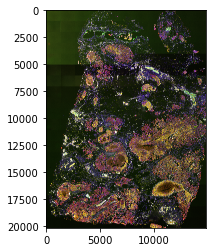

In [14]:
pseudo = tifffile.imread(f'../../multiplex_data/codex/htan/brca/{sample_id}/level_2/pseudo/dapi_panck_sma_pdpn_mgp.tiff')
plt.imshow(pseudo)

In [10]:
list(region_df.columns)

['ductal_bbox-0',
 'ductal_bbox-1',
 'ductal_bbox-2',
 'ductal_bbox-3',
 'ductal_area',
 'ductal_perimeter',
 'ductal_centroid-0',
 'ductal_centroid-1',
 'ductal_eccentricity',
 'ductal_extent',
 'ductal_compactness',
 'ductal_CD4 T cell_cell_fraction',
 'ductal_CD8 T cell_cell_fraction',
 'ductal_Endothelial_cell_fraction',
 'ductal_Fibroblast_cell_fraction',
 'ductal_Macrophage - M1_cell_fraction',
 'ductal_Macrophage - M2_cell_fraction',
 'ductal_Myoepithelial_cell_fraction',
 'ductal_Noise_cell_fraction',
 'ductal_Tumor_cell_fraction',
 'ductal_Endothelial_metacluster_fraction',
 'ductal_Macrophage M1 enriched_metacluster_fraction',
 'ductal_Macrophage M2 - enriched_metacluster_fraction',
 'ductal_Mixed Immune/Stroma_metacluster_fraction',
 'ductal_Myoepithelial_metacluster_fraction',
 'ductal_Stroma_metacluster_fraction',
 'ductal_T cell Enriched_metacluster_fraction',
 'ductal_Tumor_metacluster_fraction',
 'ductal_Tumor Boundary - M2 Macrophage Enriched_metacluster_fraction',
 'd

metric breakdown

+ region morphology/tme
 + region_types: ductal, epithelial, boundary, region
 + metrics
  + bbox-0 - bbox-3
  + area, perimeter, centroid, eccentricity, extent
  + compactness
  + *_cell_fraction
  + *_metacluster_fraction
+ myoepithelial characteristics
 + prefix: myoepithelial_metrics
 + myoepithelial_metrics_{channel}_{metric}

In [11]:
def display_region(labeled_img, region_to_value, region_to_bbox, cmap=None, add_alpha=True):
    regions, vals = zip(*region_to_value.items())
    try:
        float(vals[0])
        is_numeric = True
        cmap = cmap if cmap is not None else 'Reds'
        max_val = max(vals)
        min_val = min(vals)
        bins = np.linspace(min_val, max_val, 100)
        val_to_color = {b:c for b, c in zip(np.arange(100), sns.color_palette(cmap, n_colors=100))}
    except:
        is_numeric = False
        cats = sorted(set(vals))
        if cmap is None:
            if len(cats) <= 10:
                cmap = 'tab10'
            else:
                cmap = 'tab20'
        val_to_color = {b:c for b, c in zip(cats, sns.color_palette(cmap))}
    
    rgb = np.full((labeled_img.shape[0], labeled_img.shape[1], 3), 1., dtype=np.float32)

    if is_numeric:
        vals = np.digitize(vals, bins) - 1

    for region_id, val in zip(regions, vals):
        r1, c1, r2, c2 = region_to_bbox[region_id]
        cropped_labeled = labeled_img[r1:r2, c1:c2]
        cropped_rgb = rgb[r1:r2, c1:c2]
        cropped_rgb[cropped_labeled==region_id] = val_to_color[val] # faster on cropped
        rgb[r1:r2, c1:c2] = cropped_rgb
        
    if add_alpha:
        rgb = np.concatenate((rgb, np.ones((rgb.shape[0], rgb.shape[1], 1))), axis=-1)
        rgb[labeled_img==0] = [1., 1., 1., 0.]
        
    return rgb

In [12]:
from skimage.io import imsave
fig_dir = os.path.join(output_dir, 'metric_figures')
Path(fig_dir).mkdir(parents=True, exist_ok=True)

In [1257]:
for name in region_to_masks.keys():
    print(name)
    mask = region_to_masks[name]['mask']
    rgb = np.ones((mask.shape[0], mask.shape[1], 4))
    rgb[:, :, -1] = 0.
    rgb[mask] = [0., 0., 0., 1.]
    imsave(os.path.join(fig_dir, f'{name}_mask.png'), rgb)

ductal


epithelial


boundary


region


(20160, 14784, 4)


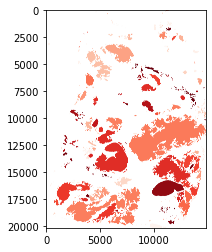

In [1254]:
metric = 'myoepithelial_metrics_combined_integrity'
rgb = display_region(
    region_to_masks['region']['labeled'],
    {k:v for k, v in zip(region_df.index, region_df[metric])},
    region_to_bbox
)
imsave(os.path.join(fig_dir, f'{metric}.png'), rgb)
plt.imshow(rgb)

(20160, 14784, 4)


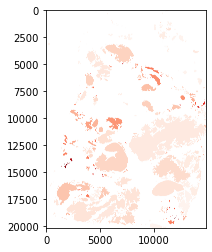

In [1258]:
metric = 'boundary_CD8 T cell_cell_fraction'
rgb = display_region(
    region_to_masks['region']['labeled'],
    {k:v for k, v in zip(region_df.index, region_df[metric])},
    region_to_bbox
)
imsave(os.path.join(fig_dir, f'{metric}.png'), rgb)
plt.imshow(rgb)

(20160, 14784, 4)


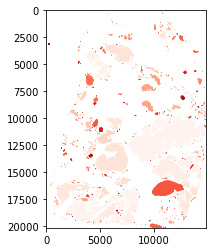

In [1259]:
metric = 'region_compactness'
rgb = display_region(
    region_to_masks['region']['labeled'],
    {k:v for k, v in zip(region_df.index, region_df[metric])},
    region_to_bbox
)
imsave(os.path.join(fig_dir, f'{metric}.png'), rgb)
plt.imshow(rgb)

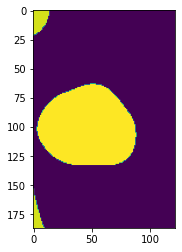

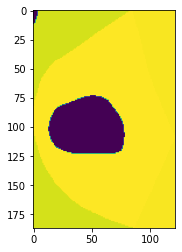

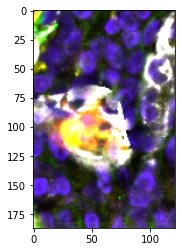

In [65]:
# l = 86
l = 93
r1, c1, r2, c2 = region_to_bbox[l]
# r1, c1 = max(r1 - 150, 0), max(c1 - 150, 0)
# r2, c2 = r2 + 150, c2 + 150
plt.imshow((region_to_masks['region']['labeled'])[r1:r2, c1:c2])
plt.show()
plt.imshow((region_to_masks['boundary']['labeled'])[r1:r2, c1:c2])
plt.show()
plt.imshow(pseudo[r1:r2, c1:c2])
plt.show()

In [60]:
d = region_to_myo_geoms[str(l)]['myo_polygons_filtered']
d.keys()

dict_keys(['polys', 'group_lines'])

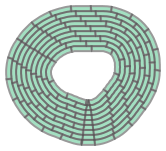

In [61]:
from shapely.wkt import loads
polys = loads(d['polys'])
shapely.GeometryCollection(list(polys))

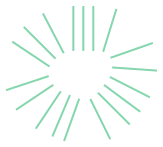

In [62]:
polys = loads(d['group_lines'])
shapely.GeometryCollection(list(polys))

In [63]:
region_to_myo_grid[l].keys()

dict_keys(['myo_grid_binary_positive_regions', 'myo_grid_labeled_regions_filtered', 'myo_grid_labeled_regions_unfiltered'])

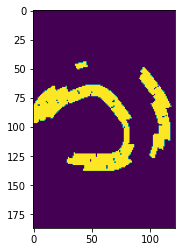

In [64]:
plt.imshow(region_to_myo_grid[l]['myo_grid_binary_positive_regions']['combined']>0)

In [36]:
region_to_myo_grid[l]['myo_grid_binary_positive_regions']['combined']

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

In [1288]:
region_df

,ductal_bbox-0,ductal_bbox-1,ductal_bbox-2,ductal_bbox-3,ductal_area,ductal_perimeter,ductal_centroid-0,ductal_centroid-1,ductal_eccentricity,ductal_extent,...,myoepithelial_metrics_Podoplanin_fraction_positive,myoepithelial_metrics_Podoplanin_integrity,myoepithelial_metrics_Podoplanin_mean_thickness,myoepithelial_metrics_Podoplanin_mean_thickness_nonbreaks,myoepithelial_metrics_combined_num_pieces,myoepithelial_metrics_combined_overlap_fraction,myoepithelial_metrics_combined_fraction_positive,myoepithelial_metrics_combined_integrity,myoepithelial_metrics_combined_mean_thickness,myoepithelial_metrics_combined_mean_thickness_nonbreaks
1,0,11012,103,11349,19482,909.949314,37.456678,11182.203367,0.968860,0.561263,...,0.083665,0.550000,1.200000,2.181818,2,0.007968,0.115538,0.550000,1.600000,2.909091
2,114,4573,189,4674,3651,294.663997,155.824432,4626.284853,0.560117,0.481980,...,0.015957,0.111111,0.185185,1.666667,3,0.000000,0.037234,0.296296,0.481481,1.625000
3,185,10694,349,10806,9244,535.043723,274.554197,10744.952942,0.759303,0.503267,...,0.027778,0.140000,0.380000,2.714286,2,0.000000,0.031250,0.160000,0.400000,2.500000
4,196,5675,380,5739,1887,421.960461,273.063063,5703.188129,0.993694,0.160241,...,0.013825,0.242424,0.242424,1.000000,2,0.000000,0.013825,0.242424,0.242424,1.000000
5,889,5997,1250,6216,29339,1253.100685,1063.439211,6113.362862,0.944522,0.371103,...,0.005282,0.025424,0.025424,1.000000,4,0.000000,0.007042,0.042373,0.042373,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,19763,8301,19904,8436,5763,479.788889,19840.532362,8377.462780,0.961015,0.302758,...,0.003731,0.022222,0.022222,1.000000,3,0.000000,0.085821,0.088889,0.533333,6.000000
439,19790,9146,19863,9219,2745,241.137085,19826.616758,9182.118033,0.840828,0.515106,...,0.006024,0.090909,0.090909,1.000000,2,0.006024,0.024096,0.090909,0.272727,3.000000
440,20021,10826,20160,11127,28747,891.168614,20100.706752,10991.130448,0.903030,0.687086,...,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000
441,20047,12287,20112,12443,2534,342.871104,20070.656275,12374.238753,0.964845,0.249901,...,0.004950,0.066667,0.066667,1.000000,1,0.000000,0.004950,0.066667,0.066667,1.000000


/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='region_area', ylabel='Density'>

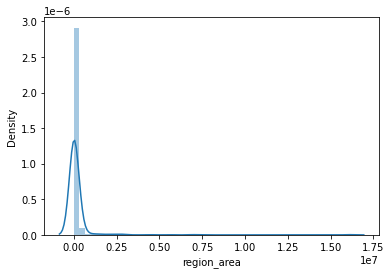

In [68]:
sns.distplot(region_df['region_area'])

In [69]:
sorted(region_df['region_area'])

[4001,
 4004,
 4069,
 4073,
 4080,
 4121,
 4123,
 4161,
 4175,
 4222,
 4232,
 4245,
 4253,
 4281,
 4308,
 4333,
 4336,
 4337,
 4339,
 4385,
 4401,
 4405,
 4417,
 4422,
 4425,
 4428,
 4434,
 4445,
 4446,
 4450,
 4451,
 4456,
 4471,
 4485,
 4550,
 4555,
 4607,
 4620,
 4633,
 4638,
 4641,
 4645,
 4650,
 4691,
 4749,
 4754,
 4767,
 4795,
 4823,
 4837,
 4859,
 4873,
 4910,
 4956,
 4984,
 4998,
 5012,
 5023,
 5081,
 5104,
 5111,
 5122,
 5129,
 5131,
 5139,
 5154,
 5175,
 5181,
 5205,
 5217,
 5221,
 5286,
 5289,
 5315,
 5344,
 5357,
 5405,
 5409,
 5446,
 5509,
 5517,
 5584,
 5610,
 5616,
 5619,
 5624,
 5638,
 5679,
 5713,
 5715,
 5715,
 5769,
 5800,
 5816,
 5831,
 5843,
 5854,
 5858,
 5867,
 5882,
 5981,
 5984,
 5994,
 6012,
 6015,
 6050,
 6100,
 6117,
 6120,
 6128,
 6149,
 6150,
 6188,
 6203,
 6238,
 6247,
 6263,
 6269,
 6281,
 6292,
 6310,
 6342,
 6353,
 6371,
 6403,
 6459,
 6486,
 6490,
 6494,
 6563,
 6573,
 6664,
 6772,
 6810,
 6838,
 6853,
 6905,
 6923,
 6923,
 6932,
 6980,
 7027,
 7055,

In [72]:
x = np.random.rand(5, 5)
x

array([[0.1471094 , 0.21845817, 0.80335583, 0.59537793, 0.26368777],
       [0.80392011, 0.6688232 , 0.75523088, 0.36912865, 0.35657321],
       [0.25320664, 0.95364071, 0.61464628, 0.67929253, 0.27462424],
       [0.33588777, 0.02988698, 0.32445331, 0.28776795, 0.92056741],
       [0.62634871, 0.04959524, 0.06746794, 0.29413615, 0.07260079]])

In [74]:
x = x > .5
x

array([[False, False,  True,  True, False],
       [ True,  True,  True, False, False],
       [False,  True,  True,  True, False],
       [False, False, False, False,  True],
       [ True, False, False, False, False]])

In [75]:
x > 0

array([[False, False,  True,  True, False],
       [ True,  True,  True, False, False],
       [False,  True,  True,  True, False],
       [False, False, False, False,  True],
       [ True, False, False, False, False]])

In [ ]:
region_to

In [104]:
region_to_myo_geoms = json.load(open('/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/brca_dcis_v1/region_metrics/HT206B1_H1_06252022/outputs/grid_polygons.json'))
region_to_bbox = {region_id: (r1, c1, r2, c2)
                  for region_id, r1, c1, r2, c2 in zip(region_df.index, region_df['boundary_bbox-0'], region_df['boundary_bbox-1'], region_df['boundary_bbox-2'], region_df['boundary_bbox-3'])}

In [105]:
l = 10
d = region_to_myo_geoms[str(l)]['polygons_unfiltered']


In [ ]:
r1, c1, r2, c2 = region_to_bbox[l]
# r1, c1 = max(r1 - 150, 0), max(c1 - 150, 0)
# r2, c2 = r2 + 150, c2 + 150
plt.imshow((region_to_masks['region']['labeled'])[r1:r2, c1:c2])
plt.show()

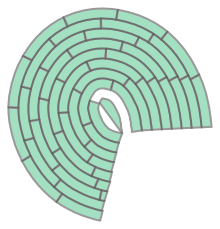

In [106]:
from shapely.wkt import loads
polys = loads(d['polys'])
shapely.GeometryCollection(list(polys))

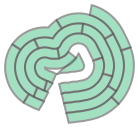

In [102]:
shapely.GeometryCollection([p for p in polys[:20]])

In [101]:
polys[1].area

579.6190264079321

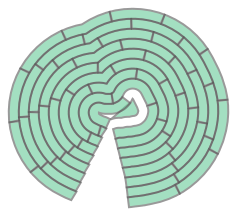

In [103]:
shapely.GeometryCollection([p for p in polys if p.area < 2000])

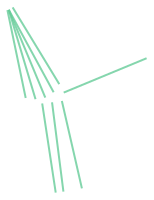

In [93]:
polys = loads(d['group_lines'])
shapely.GeometryCollection(list(polys))

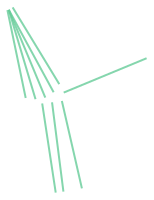

In [96]:
shapely.GeometryCollection([p for p in polys if p.length < 100])

In [92]:
d.keys()

dict_keys(['polys', 'group_lines'])